In [1]:
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
%matplotlib inline
%config InlineBackend.figure_format='retina'
import cmocean
import cartopy.crs as ccrs
import matplotlib.path as mpath
import nc_time_axis
import pandas as pd
import matplotlib as mpl
import momlevel as ml
import gcsfs
import zarr
from matplotlib.ticker import FormatStrFormatter

In [2]:
def south_pole_map(cols=1, rows=1, fig_size=(12,8), max_extent=-50, facecolor='white'):
    ''' 
    User note: In order to call the function, begin cell with: fig, ax = south_pole_map(**args).
    
    Neglecting "fig, ax =" at the begeinning will not map your data to the existing axes.
    
    This function sets up a polar projection centered at the South Pole, which DataArrays can be plotted over.
    
    Optional arguments accepted for figure size, maximum (northward) extent and facecolor. Any number of columns and/or rows are also accepted for multiple subplots.
    
    If creating multiple subplots, ax=ax[*index*] must be passed in the plot call for each array.
    
    By default, these are set to (12,8), -50ºS and gray, respectively. Columns/Rows set to 1 by default – specifying axes in which to plot data is not necessary when using default column number.
    '''
    import matplotlib.path as mpath
    import numpy as np
    import cartopy.crs as ccrs
    
    fig,ax = plt.subplots(figsize=fig_size, ncols=cols, nrows=rows, subplot_kw={'projection': ccrs.SouthPolarStereo(), 'facecolor':facecolor}, layout='constrained')

    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    
    if rows>1 and cols>1:
        for i in range(rows):
            for j in range(cols):
                ax[i,j].set_boundary(circle, transform=ax[i,j].transAxes)

                # lat/long map extents. shows south pole out to 50ºS
                ax[i,j].set_extent([-180, 180, -90, max_extent], ccrs.PlateCarree())
    elif cols>1 and rows==1:
        for i in range(cols):
            ax[i].set_boundary(circle, transform=ax[i].transAxes)

            # lat/long map extents. shows south pole out to 50ºS
            ax[i].set_extent([-180, 180, -90, max_extent], ccrs.PlateCarree())
    elif rows>1 and cols==1:
        for i in range(rows):
            ax[i].set_boundary(circle, transform=ax[i].transAxes)

            # lat/long map extents. shows south pole out to 50ºS
            ax[i].set_extent([-180, 180, -90, max_extent], ccrs.PlateCarree())
    else:
        ax.set_boundary(circle, transform=ax.transAxes)

            # lat/long map extents. shows south pole out to 50ºS
        ax.set_extent([-180, 180, -90, max_extent], ccrs.PlateCarree())
    
    
    #must return fig, ax when creating multiple subplots in a function
    return fig, ax

In [3]:
mask_CM4= xr.open_dataset('/home/pachamama/shared/antarctica_mask/CM4_mask_antarctica.nc')
mask_ESM4= xr.open_dataset('/home/pachamama/shared/antarctica_mask/ESM4_mask_antarctica.nc')
mask_ERA5= xr.open_dataset('/home/pachamama/shared/antarctica_mask/ERA5_mask_antarctica.nc')

In [4]:
google_cloud_cmip6 = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv')


In [5]:
gfdl_esm4_temp_data = google_cloud_cmip6.query(
    # "activity_id=='ScenarioMIP' & \
    "table_id == 'Amon' & \
    variable_id == 'ta' & \
    experiment_id == 'historical' & \
    institution_id == 'NOAA-GFDL' &  \
    source_id == 'GFDL-ESM4' & \
    member_id == 'r1i1p1f1'"	
    )
     

In [6]:
gfdl_cm4_temp_data = google_cloud_cmip6.query(
    #"activity_id=='ScenarioMIP' & \
    "table_id == 'Amon' & \
    variable_id == 'ta' & \
    experiment_id == 'historical' & \
    institution_id == 'NOAA-GFDL' &  \
    source_id == 'GFDL-CM4'"
)

In [7]:
gfdl_esm4_temp_data

,activity_id,institution_id,source_id,experiment_id,member_id,table_id,variable_id,grid_label,zstore,dcpp_init_year,version
244701,CMIP,NOAA-GFDL,GFDL-ESM4,historical,r1i1p1f1,Amon,ta,gr1,gs://cmip6/CMIP6/CMIP/NOAA-GFDL/GFDL-ESM4/hist...,NaN,20190726


In [8]:
gfdl_cm4_temp_data

,activity_id,institution_id,source_id,experiment_id,member_id,table_id,variable_id,grid_label,zstore,dcpp_init_year,version
6728,CMIP,NOAA-GFDL,GFDL-CM4,historical,r1i1p1f1,Amon,ta,gr1,gs://cmip6/CMIP6/CMIP/NOAA-GFDL/GFDL-CM4/histo...,NaN,20180701


In [9]:
gcs = gcsfs.GCSFileSystem(token='anon')
zstore = gfdl_cm4_temp_data.zstore.values[-1]
mapper = gcs.get_mapper(zstore)

CM4_historical_temp = xr.open_zarr(mapper, consolidated=True)
CM4_historical_temp

<xarray.Dataset>
Dimensions:    (bnds: 2, lat: 180, lon: 288, plev: 19, time: 1980)
Coordinates:
  * bnds       (bnds) float64 1.0 2.0
  * lat        (lat) float64 -89.5 -88.5 -87.5 -86.5 ... 86.5 87.5 88.5 89.5
    lat_bnds   (lat, bnds) float64 dask.array<chunksize=(180, 2), meta=np.ndarray>
  * lon        (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
    lon_bnds   (lon, bnds) float64 dask.array<chunksize=(288, 2), meta=np.ndarray>
  * plev       (plev) float64 1e+05 9.25e+04 8.5e+04 7e+04 ... 1e+03 500.0 100.0
  * time       (time) object 1850-01-16 12:00:00 ... 2014-12-16 12:00:00
    time_bnds  (time, bnds) object dask.array<chunksize=(1980, 2), meta=np.ndarray>
Data variables:
    ta         (time, plev, lat, lon) float32 dask.array<chunksize=(60, 19, 180, 288), meta=np.ndarray>
Attributes: (12/49)
    Conventions:            CF-1.7 CMIP-6.0 UGRID-1.0
    activity_id:            CMIP
    branch_method:          standard
    branch_time_in_child:   0.0
    branch_time_in_parent:  36500.0
    comment:                <null ref>
    ...                     ...
    variable_id:            ta
    variant_info:           N/A
    variant_label:          r1i1p1f1
    status:                 2019-08-07;created;by nhn2@columbia.edu
    netcdf_tracking_ids:    hdl:21.14100/3573d4ca-e247-423b-9ad3-2bb0d05de9e3...
    version_id:             v20180701

In [10]:
gcs = gcsfs.GCSFileSystem(token='anon')
zstore = gfdl_esm4_temp_data.zstore.values[-1]
mapper = gcs.get_mapper(zstore)

ESM4_historical_temp= xr.open_zarr(mapper, consolidated=True)
ESM4_historical_temp

<xarray.Dataset>
Dimensions:    (bnds: 2, lat: 180, lon: 288, plev: 19, time: 1980)
Coordinates:
  * bnds       (bnds) float64 1.0 2.0
  * lat        (lat) float64 -89.5 -88.5 -87.5 -86.5 ... 86.5 87.5 88.5 89.5
    lat_bnds   (lat, bnds) float64 dask.array<chunksize=(180, 2), meta=np.ndarray>
  * lon        (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
    lon_bnds   (lon, bnds) float64 dask.array<chunksize=(288, 2), meta=np.ndarray>
  * plev       (plev) float64 1e+05 9.25e+04 8.5e+04 7e+04 ... 1e+03 500.0 100.0
  * time       (time) object 1850-01-16 12:00:00 ... 2014-12-16 12:00:00
    time_bnds  (time, bnds) object dask.array<chunksize=(1980, 2), meta=np.ndarray>
Data variables:
    ta         (time, plev, lat, lon) float32 dask.array<chunksize=(30, 19, 180, 288), meta=np.ndarray>
Attributes: (12/49)
    Conventions:            CF-1.7 CMIP-6.0 UGRID-1.0
    activity_id:            CMIP
    branch_method:          standard
    branch_time_in_child:   0.0
    branch_time_in_parent:  36500.0
    comment:                <null ref>
    ...                     ...
    variable_id:            ta
    variant_info:           N/A
    variant_label:          r1i1p1f1
    status:                 2019-09-10;created;by nhn2@columbia.edu
    netcdf_tracking_ids:    hdl:21.14100/1a3dcab3-d2ed-4934-9415-d59fdd32c6cf...
    version_id:             v20190726

In [11]:
#selecting precip variable
temp_ESM4_95= ESM4_historical_temp.ta.sel(time=slice('1995-01-01','2014-12-01'))
temp_CM4_95=CM4_historical_temp.ta.sel(time=slice('1995-01-01','2014-12-01'))

In [12]:
temp_ESM4_95

<xarray.DataArray 'ta' (time: 239, plev: 19, lat: 180, lon: 288)>
dask.array<getitem, shape=(239, 19, 180, 288), dtype=float32, chunksize=(30, 19, 180, 288), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
  * plev     (plev) float64 1e+05 9.25e+04 8.5e+04 7e+04 ... 1e+03 500.0 100.0
  * time     (time) object 1995-01-16 12:00:00 ... 2014-11-16 00:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   time: mean
    interp_method:  conserve_order2
    long_name:      Air Temperature
    original_name:  ta
    standard_name:  air_temperature
    units:          K

In [13]:
observational_temp= xr.open_dataset('//home/tu.temple.edu/tuo59681/era5/temp/era5_2m_temperature_1940-2024_monthly_ensemble.nc')

In [14]:
ERA5_observational_temp=observational_temp.t2m

In [15]:
#combining the expver 1 and 5 values into one data set to remove the dimension
ERA5_combine =ERA5_observational_temp.sel(expver=1).combine_first(ERA5_observational_temp.sel(expver=5))
ERA5_combine.load()

<xarray.DataArray 't2m' (time: 1013, number: 10, latitude: 361, longitude: 720)>
array([[[[249.01538, 249.01538, 249.01538, ..., 249.01538, 249.01538,
          249.01538],
         [249.35663, 249.35843, 249.36023, ..., 249.35301, 249.35483,
          249.35663],
         [249.64009, 249.64369, 249.64731, ..., 249.62926, 249.63286,
          249.63467],
         ...,
         [244.36626, 244.36446, 244.36264, ..., 244.37529, 244.37167,
          244.36987],
         [244.07196, 244.07016, 244.07016, ..., 244.07738, 244.07738,
          244.07558],
         [243.3931 , 243.3931 , 243.3931 , ..., 243.3931 , 243.3931 ,
          243.3931 ]],

        [[245.31233, 245.31233, 245.31233, ..., 245.31233, 245.31233,
          245.31233],
         [245.63191, 245.63551, 245.63733, ..., 245.62468, 245.6265 ,
          245.6301 ],
         [245.993  , 245.99841, 246.00565, ..., 245.97495, 245.98218,
          245.98758],
...
         [256.00262, 256.00262, 256.00262, ..., 256.00262, 256.00262,
          256.00262],
         [256.00262, 256.00262, 256.00262, ..., 256.00262, 256.00262,
          256.00262],
         [256.00262, 256.00262, 256.00262, ..., 256.00262, 256.00262,
          256.00262]],

        [[256.00262, 256.00262, 256.00262, ..., 256.00262, 256.00262,
          256.00262],
         [256.00262, 256.00262, 256.00262, ..., 256.00262, 256.00262,
          256.00262],
         [256.00262, 256.00262, 256.00262, ..., 256.00262, 256.00262,
          256.00262],
         ...,
         [256.00262, 256.00262, 256.00262, ..., 256.00262, 256.00262,
          256.00262],
         [256.00262, 256.00262, 256.00262, ..., 256.00262, 256.00262,
          256.00262],
         [256.00262, 256.00262, 256.00262, ..., 256.00262, 256.00262,
          256.00262]]]], dtype=float32)
Coordinates:
  * longitude  (longitude) float32 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * latitude   (latitude) float32 90.0 89.5 89.0 88.5 ... -89.0 -89.5 -90.0
  * number     (number) int32 0 1 2 3 4 5 6 7 8 9
  * time       (time) datetime64[ns] 1940-01-01 1940-02-01 ... 2024-05-01
Attributes:
    units:      K
    long_name:  2 metre temperature

In [16]:
temp_ERA5_95=ERA5_combine.mean('number').sel(time=slice('1995-01-01','2014-12-01'))

In [17]:
temp_seasonal_CM4_95 = temp_CM4_95.groupby('time.season').mean(dim='time')
temp_summer_CM4_95= temp_seasonal_CM4_95.sel(season= 'DJF')
temp_winter_CM4_95=temp_seasonal_CM4_95.sel(season='JJA')
temp_spring_CM4_95=temp_seasonal_CM4_95.sel(season='SON')
temp_fall_CM4_95=temp_seasonal_CM4_95.sel(season='MAM')

In [18]:
temp_seasonal_ESM4_95 = temp_ESM4_95.groupby('time.season').mean(dim='time')
temp_summer_ESM4_95= temp_seasonal_ESM4_95.sel(season= 'DJF')
temp_winter_ESM4_95=temp_seasonal_ESM4_95.sel(season='JJA')
temp_spring_ESM4_95=temp_seasonal_ESM4_95.sel(season='SON')
temp_fall_ESM4_95=temp_seasonal_ESM4_95.sel(season='MAM')

In [19]:
temp_seasonal_ERA5_95 = temp_ERA5_95.groupby('time.season').mean(dim='time')
temp_summer_ERA5_95= temp_seasonal_ERA5_95.sel(season= 'DJF')
temp_winter_ERA5_95=temp_seasonal_ERA5_95.sel(season='JJA')
temp_spring_ERA5_95=temp_seasonal_ERA5_95.sel(season='SON')
temp_fall_ERA5_95=temp_seasonal_ERA5_95.sel(season='MAM')

In [20]:
plateau_temp_total_CM4_95=(temp_CM4_95*(mask_CM4.plateau_CM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon').mean(dim='time')
ross_temp_total_CM4_95=(temp_CM4_95*(mask_CM4.ross_CM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon').mean(dim='time')
lowwest_temp_total_CM4_95=(temp_CM4_95*(mask_CM4.lowwest_CM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon').mean(dim='time')
loweast_temp_total_CM4_95=(temp_CM4_95*(mask_CM4.loweast_CM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon').mean(dim='time')
filchner_temp_total_CM4_95=(temp_CM4_95*(mask_CM4.filchner_CM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon').mean(dim='time')
peninsula_temp_total_CM4_95=(temp_CM4_95*(mask_CM4.peninsula_CM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon').mean(dim='time')

plateau_temp_total_ESM4_95=(temp_ESM4_95*(mask_ESM4.plateau_ESM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon').mean(dim='time')
ross_temp_total_ESM4_95=(temp_ESM4_95*(mask_ESM4.ross_ESM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon').mean(dim='time')
lowwest_temp_total_ESM4_95=(temp_ESM4_95*(mask_ESM4.lowwest_ESM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon').mean(dim='time')
loweast_temp_total_ESM4_95=(temp_ESM4_95*(mask_ESM4.loweast_ESM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon').mean(dim='time')
filchner_temp_total_ESM4_95=(temp_ESM4_95*(mask_ESM4.filchner_ESM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon').mean(dim='time')
peninsula_temp_total_ESM4_95=(temp_ESM4_95*(mask_ESM4.peninsula_ESM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon').mean(dim='time')

plateau_temp_total_ERA5_95=(temp_ERA5_95*(mask_ERA5.plateau_ERA5)).mean(dim='latitude').mean(dim='longitude').mean(dim='time')
ross_temp_total_ERA5_95=(temp_ERA5_95*(mask_ERA5.ross_ERA5)).mean(dim='latitude').mean(dim='longitude').mean(dim='time')
lowwest_temp_total_ERA5_95=(temp_ERA5_95*(mask_ERA5.lowwest_ERA5)).mean(dim='latitude').mean(dim='longitude').mean(dim='time')
loweast_temp_total_ERA5_95=(temp_ERA5_95*(mask_ERA5.loweast_ERA5)).mean(dim='latitude').mean(dim='longitude').mean(dim='time')
filchner_temp_total_ERA5_95=(temp_ERA5_95*(mask_ERA5.filchner_ERA5)).mean(dim='latitude').mean(dim='longitude').mean(dim='time')
peninsula_temp_total_ERA5_95=(temp_ERA5_95*(mask_ERA5.peninsula_ERA5)).mean(dim='latitude').mean(dim='longitude').mean(dim='time')


In [21]:
plateau_temp_summer_CM4_95=(temp_summer_CM4_95*(mask_CM4.plateau_CM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
ross_temp_summer_CM4_95=(temp_summer_CM4_95*(mask_CM4.ross_CM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
lowwest_temp_summer_CM4_95=(temp_summer_CM4_95*(mask_CM4.lowwest_CM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
loweast_temp_summer_CM4_95=(temp_summer_CM4_95*(mask_CM4.loweast_CM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
filchner_temp_summer_CM4_95=(temp_summer_CM4_95*(mask_CM4.filchner_CM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
peninsula_temp_summer_CM4_95=(temp_summer_CM4_95*(mask_CM4.peninsula_CM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')

plateau_temp_summer_ESM4_95=(temp_summer_ESM4_95*(mask_ESM4.plateau_ESM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
ross_temp_summer_ESM4_95=(temp_summer_ESM4_95*(mask_ESM4.ross_ESM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
lowwest_temp_summer_ESM4_95=(temp_summer_ESM4_95*(mask_ESM4.lowwest_ESM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
loweast_temp_summer_ESM4_95=(temp_summer_ESM4_95*(mask_ESM4.loweast_ESM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
filchner_temp_summer_ESM4_95=(temp_summer_ESM4_95*(mask_ESM4.filchner_ESM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
peninsula_temp_summer_ESM4_95=(temp_summer_ESM4_95*(mask_ESM4.peninsula_ESM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')

plateau_temp_summer_ERA5_95=(temp_summer_ERA5_95*(mask_ERA5.plateau_ERA5)).mean(dim='latitude').mean(dim='longitude')
ross_temp_summer_ERA5_95=(temp_summer_ERA5_95*(mask_ERA5.ross_ERA5)).mean(dim='latitude').mean(dim='longitude')
lowwest_temp_summer_ERA5_95=(temp_summer_ERA5_95*(mask_ERA5.lowwest_ERA5)).mean(dim='latitude').mean(dim='longitude')
loweast_temp_summer_ERA5_95=(temp_summer_ERA5_95*(mask_ERA5.loweast_ERA5)).mean(dim='latitude').mean(dim='longitude')
filchner_temp_summer_ERA5_95=(temp_summer_ERA5_95*(mask_ERA5.filchner_ERA5)).mean(dim='latitude').mean(dim='longitude')
peninsula_temp_summer_ERA5_95=(temp_summer_ERA5_95*(mask_ERA5.peninsula_ERA5)).mean(dim='latitude').mean(dim='longitude')

In [22]:
plateau_temp_winter_CM4_95=(temp_winter_CM4_95*(mask_CM4.plateau_CM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
ross_temp_winter_CM4_95=(temp_winter_CM4_95*(mask_CM4.ross_CM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
lowwest_temp_winter_CM4_95=(temp_winter_CM4_95*(mask_CM4.lowwest_CM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
loweast_temp_winter_CM4_95=(temp_winter_CM4_95*(mask_CM4.loweast_CM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
filchner_temp_winter_CM4_95=(temp_winter_CM4_95*(mask_CM4.filchner_CM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
peninsula_temp_winter_CM4_95=(temp_winter_CM4_95*(mask_CM4.peninsula_CM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')

plateau_temp_winter_ESM4_95=(temp_winter_ESM4_95*(mask_ESM4.plateau_ESM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
ross_temp_winter_ESM4_95=(temp_winter_ESM4_95*(mask_ESM4.ross_ESM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
lowwest_temp_winter_ESM4_95=(temp_winter_ESM4_95*(mask_ESM4.lowwest_ESM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
loweast_temp_winter_ESM4_95=(temp_winter_ESM4_95*(mask_ESM4.loweast_ESM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
filchner_temp_winter_ESM4_95=(temp_winter_ESM4_95*(mask_ESM4.filchner_ESM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
peninsula_temp_winter_ESM4_95=(temp_winter_ESM4_95*(mask_ESM4.peninsula_ESM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')

plateau_temp_winter_ERA5_95=(temp_winter_ERA5_95*(mask_ERA5.plateau_ERA5)).mean(dim='latitude').mean(dim='longitude')
ross_temp_winter_ERA5_95=(temp_winter_ERA5_95*(mask_ERA5.ross_ERA5)).mean(dim='latitude').mean(dim='longitude')
lowwest_temp_winter_ERA5_95=(temp_winter_ERA5_95*(mask_ERA5.lowwest_ERA5)).mean(dim='latitude').mean(dim='longitude')
loweast_temp_winter_ERA5_95=(temp_winter_ERA5_95*(mask_ERA5.loweast_ERA5)).mean(dim='latitude').mean(dim='longitude')
filchner_temp_winter_ERA5_95=(temp_winter_ERA5_95*(mask_ERA5.filchner_ERA5)).mean(dim='latitude').mean(dim='longitude')
peninsula_temp_winter_ERA5_95=(temp_winter_ERA5_95*(mask_ERA5.peninsula_ERA5)).mean(dim='latitude').mean(dim='longitude')

In [23]:
plateau_temp_fall_CM4_95=(temp_fall_CM4_95*(mask_CM4.plateau_CM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
ross_temp_fall_CM4_95=(temp_fall_CM4_95*(mask_CM4.ross_CM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
lowwest_temp_fall_CM4_95=(temp_fall_CM4_95*(mask_CM4.lowwest_CM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
loweast_temp_fall_CM4_95=(temp_fall_CM4_95*(mask_CM4.loweast_CM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
filchner_temp_fall_CM4_95=(temp_fall_CM4_95*(mask_CM4.filchner_CM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
peninsula_temp_fall_CM4_95=(temp_fall_CM4_95*(mask_CM4.peninsula_CM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')

plateau_temp_fall_ESM4_95=(temp_fall_ESM4_95*(mask_ESM4.plateau_ESM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
ross_temp_fall_ESM4_95=(temp_fall_ESM4_95*(mask_ESM4.ross_ESM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
lowwest_temp_fall_ESM4_95=(temp_fall_ESM4_95*(mask_ESM4.lowwest_ESM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
loweast_temp_fall_ESM4_95=(temp_fall_ESM4_95*(mask_ESM4.loweast_ESM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
filchner_temp_fall_ESM4_95=(temp_fall_ESM4_95*(mask_ESM4.filchner_ESM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
peninsula_temp_fall_ESM4_95=(temp_fall_ESM4_95*(mask_ESM4.peninsula_ESM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')

plateau_temp_fall_ERA5_95=(temp_fall_ERA5_95*(mask_ERA5.plateau_ERA5)).mean(dim='latitude').mean(dim='longitude')
ross_temp_fall_ERA5_95=(temp_fall_ERA5_95*(mask_ERA5.ross_ERA5)).mean(dim='latitude').mean(dim='longitude')
lowwest_temp_fall_ERA5_95=(temp_fall_ERA5_95*(mask_ERA5.lowwest_ERA5)).mean(dim='latitude').mean(dim='longitude')
loweast_temp_fall_ERA5_95=(temp_fall_ERA5_95*(mask_ERA5.loweast_ERA5)).mean(dim='latitude').mean(dim='longitude')
filchner_temp_fall_ERA5_95=(temp_fall_ERA5_95*(mask_ERA5.filchner_ERA5)).mean(dim='latitude').mean(dim='longitude')
peninsula_temp_fall_ERA5_95=(temp_fall_ERA5_95*(mask_ERA5.peninsula_ERA5)).mean(dim='latitude').mean(dim='longitude')

In [24]:
plateau_temp_spring_CM4_95=(temp_spring_CM4_95*(mask_CM4.plateau_CM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
ross_temp_spring_CM4_95=(temp_spring_CM4_95*(mask_CM4.ross_CM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
lowwest_temp_spring_CM4_95=(temp_spring_CM4_95*(mask_CM4.lowwest_CM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
loweast_temp_spring_CM4_95=(temp_spring_CM4_95*(mask_CM4.loweast_CM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
filchner_temp_spring_CM4_95=(temp_spring_CM4_95*(mask_CM4.filchner_CM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
peninsula_temp_spring_CM4_95=(temp_spring_CM4_95*(mask_CM4.peninsula_CM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')

plateau_temp_spring_ESM4_95=(temp_spring_ESM4_95*(mask_ESM4.plateau_ESM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
ross_temp_spring_ESM4_95=(temp_spring_ESM4_95*(mask_ESM4.ross_ESM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
lowwest_temp_spring_ESM4_95=(temp_spring_ESM4_95*(mask_ESM4.lowwest_ESM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
loweast_temp_spring_ESM4_95=(temp_spring_ESM4_95*(mask_ESM4.loweast_ESM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
filchner_temp_spring_ESM4_95=(temp_spring_ESM4_95*(mask_ESM4.filchner_ESM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')
peninsula_temp_spring_ESM4_95=(temp_spring_ESM4_95*(mask_ESM4.peninsula_ESM4)).mean(dim='plev').mean(dim='lat').mean(dim='lon')

plateau_temp_spring_ERA5_95=(temp_spring_ERA5_95*(mask_ERA5.plateau_ERA5)).mean(dim='latitude').mean(dim='longitude')
ross_temp_spring_ERA5_95=(temp_spring_ERA5_95*(mask_ERA5.ross_ERA5)).mean(dim='latitude').mean(dim='longitude')
lowwest_temp_spring_ERA5_95=(temp_spring_ERA5_95*(mask_ERA5.lowwest_ERA5)).mean(dim='latitude').mean(dim='longitude')
loweast_temp_spring_ERA5_95=(temp_spring_ERA5_95*(mask_ERA5.loweast_ERA5)).mean(dim='latitude').mean(dim='longitude')
filchner_temp_spring_ERA5_95=(temp_spring_ERA5_95*(mask_ERA5.filchner_ERA5)).mean(dim='latitude').mean(dim='longitude')
peninsula_temp_spring_ERA5_95=(temp_spring_ERA5_95*(mask_ERA5.peninsula_ERA5)).mean(dim='latitude').mean(dim='longitude')

In [25]:
plateau_temp_total_CM4_spatial_95=(temp_CM4_95*(mask_CM4.plateau_CM4)).mean(dim='plev').mean(dim='time')
ross_temp_total_CM4_spatial_95=(temp_CM4_95*(mask_CM4.ross_CM4)).mean(dim='plev').mean(dim='time')
lowwest_temp_total_CM4_spatial_95=(temp_CM4_95*(mask_CM4.lowwest_CM4)).mean(dim='plev').mean(dim='time')
loweast_temp_total_CM4_spatial_95=(temp_CM4_95*(mask_CM4.loweast_CM4)).mean(dim='plev').mean(dim='time')
filchner_temp_total_CM4_spatial_95=(temp_CM4_95*(mask_CM4.filchner_CM4)).mean(dim='plev').mean(dim='time')
peninsula_temp_total_CM4_spatial_95=(temp_CM4_95*(mask_CM4.peninsula_CM4)).mean(dim='plev').mean(dim='time')

plateau_temp_total_ESM4_spatial_95=(temp_ESM4_95*(mask_ESM4.plateau_ESM4)).mean(dim='plev').mean(dim='time')
ross_temp_total_ESM4_spatial_95=(temp_ESM4_95*(mask_ESM4.ross_ESM4)).mean(dim='plev').mean(dim='time')
lowwest_temp_total_ESM4_spatial_95=(temp_ESM4_95*(mask_ESM4.lowwest_ESM4)).mean(dim='plev').mean(dim='time')
loweast_temp_total_ESM4_spatial_95=(temp_ESM4_95*(mask_ESM4.loweast_ESM4)).mean(dim='plev').mean(dim='time')
filchner_temp_total_ESM4_spatial_95=(temp_ESM4_95*(mask_ESM4.filchner_ESM4)).mean(dim='plev').mean(dim='time')
peninsula_temp_total_ESM4_spatial_95=(temp_ESM4_95*(mask_ESM4.peninsula_ESM4)).mean(dim='plev').mean(dim='time')

plateau_temp_total_ERA5_spatial_95=(temp_ERA5_95*(mask_ERA5.plateau_ERA5)).mean(dim='time')
ross_temp_total_ERA5_spatial_95=(temp_ERA5_95*(mask_ERA5.ross_ERA5)).mean(dim='time')
lowwest_temp_total_ERA5_spatial_95=(temp_ERA5_95*(mask_ERA5.lowwest_ERA5)).mean(dim='time')
loweast_temp_total_ERA5_spatial_95=(temp_ERA5_95*(mask_ERA5.loweast_ERA5)).mean(dim='time')
filchner_temp_total_ERA5_spatial_95=(temp_ERA5_95*(mask_ERA5.filchner_ERA5)).mean(dim='time')
peninsula_temp_total_ERA5_spatial_95=(temp_ERA5_95*(mask_ERA5.peninsula_ERA5)).mean(dim='time')

In [26]:
plateau_temp_summer_CM4_spatial_95=(temp_summer_CM4_95*(mask_CM4.plateau_CM4)).mean(dim='plev')
ross_temp_summer_CM4_spatial_95=(temp_summer_CM4_95*(mask_CM4.ross_CM4)).mean(dim='plev')
lowwest_temp_summer_CM4_spatial_95=(temp_summer_CM4_95*(mask_CM4.lowwest_CM4)).mean(dim='plev')
loweast_temp_summer_CM4_spatial_95=(temp_summer_CM4_95*(mask_CM4.loweast_CM4)).mean(dim='plev')
filchner_temp_summer_CM4_spatial_95=(temp_summer_CM4_95*(mask_CM4.filchner_CM4)).mean(dim='plev')
peninsula_temp_summer_CM4_spatial_95=(temp_summer_CM4_95*(mask_CM4.peninsula_CM4)).mean(dim='plev')

plateau_temp_summer_ESM4_spatial_95=(temp_summer_ESM4_95*(mask_ESM4.plateau_ESM4)).mean(dim='plev')
ross_temp_summer_ESM4_spatial_95=(temp_summer_ESM4_95*(mask_ESM4.ross_ESM4)).mean(dim='plev')
lowwest_temp_summer_ESM4_spatial_95=(temp_summer_ESM4_95*(mask_ESM4.lowwest_ESM4)).mean(dim='plev')
loweast_temp_summer_ESM4_spatial_95=(temp_summer_ESM4_95*(mask_ESM4.loweast_ESM4)).mean(dim='plev')
filchner_temp_summer_ESM4_spatial_95=(temp_summer_ESM4_95*(mask_ESM4.filchner_ESM4)).mean(dim='plev')
peninsula_temp_summer_ESM4_spatial_95=(temp_summer_ESM4_95*(mask_ESM4.peninsula_ESM4)).mean(dim='plev')

plateau_temp_summer_ERA5_spatial_95=(temp_summer_ERA5_95*(mask_ERA5.plateau_ERA5))
ross_temp_summer_ERA5_spatial_95=(temp_summer_ERA5_95*(mask_ERA5.ross_ERA5))
lowwest_temp_summer_ERA5_spatial_95=(temp_summer_ERA5_95*(mask_ERA5.lowwest_ERA5))
loweast_temp_summer_ERA5_spatial_95=(temp_summer_ERA5_95*(mask_ERA5.loweast_ERA5))
filchner_temp_summer_ERA5_spatial_95=(temp_summer_ERA5_95*(mask_ERA5.filchner_ERA5))
peninsula_temp_summer_ERA5_spatial_95=(temp_summer_ERA5_95*(mask_ERA5.peninsula_ERA5))

In [27]:
plateau_temp_winter_CM4_spatial_95=(temp_winter_CM4_95*(mask_CM4.plateau_CM4)).mean(dim='plev')
ross_temp_winter_CM4_spatial_95=(temp_winter_CM4_95*(mask_CM4.ross_CM4)).mean(dim='plev')
lowwest_temp_winter_CM4_spatial_95=(temp_winter_CM4_95*(mask_CM4.lowwest_CM4)).mean(dim='plev')
loweast_temp_winter_CM4_spatial_95=(temp_winter_CM4_95*(mask_CM4.loweast_CM4)).mean(dim='plev')
filchner_temp_winter_CM4_spatial_95=(temp_winter_CM4_95*(mask_CM4.filchner_CM4)).mean(dim='plev')
peninsula_temp_winter_CM4_spatial_95=(temp_winter_CM4_95*(mask_CM4.peninsula_CM4)).mean(dim='plev')

plateau_temp_winter_ESM4_spatial_95=(temp_winter_ESM4_95*(mask_ESM4.plateau_ESM4)).mean(dim='plev')
ross_temp_winter_ESM4_spatial_95=(temp_winter_ESM4_95*(mask_ESM4.ross_ESM4)).mean(dim='plev')
lowwest_temp_winter_ESM4_spatial_95=(temp_winter_ESM4_95*(mask_ESM4.lowwest_ESM4)).mean(dim='plev')
loweast_temp_winter_ESM4_spatial_95=(temp_winter_ESM4_95*(mask_ESM4.loweast_ESM4)).mean(dim='plev')
filchner_temp_winter_ESM4_spatial_95=(temp_winter_ESM4_95*(mask_ESM4.filchner_ESM4)).mean(dim='plev')
peninsula_temp_winter_ESM4_spatial_95=(temp_winter_ESM4_95*(mask_ESM4.peninsula_ESM4)).mean(dim='plev')

plateau_temp_winter_ERA5_spatial_95=(temp_winter_ERA5_95*(mask_ERA5.plateau_ERA5))
ross_temp_winter_ERA5_spatial_95=(temp_winter_ERA5_95*(mask_ERA5.ross_ERA5))
lowwest_temp_winter_ERA5_spatial_95=(temp_winter_ERA5_95*(mask_ERA5.lowwest_ERA5))
loweast_temp_winter_ERA5_spatial_95=(temp_winter_ERA5_95*(mask_ERA5.loweast_ERA5))
filchner_temp_winter_ERA5_spatial_95=(temp_winter_ERA5_95*(mask_ERA5.filchner_ERA5))
peninsula_temp_winter_ERA5_spatial_95=(temp_winter_ERA5_95*(mask_ERA5.peninsula_ERA5))

In [28]:
plateau_temp_fall_CM4_spatial_95=(temp_fall_CM4_95*(mask_CM4.plateau_CM4)).mean(dim='plev')
ross_temp_fall_CM4_spatial_95=(temp_fall_CM4_95*(mask_CM4.ross_CM4)).mean(dim='plev')
lowwest_temp_fall_CM4_spatial_95=(temp_fall_CM4_95*(mask_CM4.lowwest_CM4)).mean(dim='plev')
loweast_temp_fall_CM4_spatial_95=(temp_fall_CM4_95*(mask_CM4.loweast_CM4)).mean(dim='plev')
filchner_temp_fall_CM4_spatial_95=(temp_fall_CM4_95*(mask_CM4.filchner_CM4)).mean(dim='plev')
peninsula_temp_fall_CM4_spatial_95=(temp_fall_CM4_95*(mask_CM4.peninsula_CM4)).mean(dim='plev')

plateau_temp_fall_ESM4_spatial_95=(temp_fall_ESM4_95*(mask_ESM4.plateau_ESM4)).mean(dim='plev')
ross_temp_fall_ESM4_spatial_95=(temp_fall_ESM4_95*(mask_ESM4.ross_ESM4)).mean(dim='plev')
lowwest_temp_fall_ESM4_spatial_95=(temp_fall_ESM4_95*(mask_ESM4.lowwest_ESM4)).mean(dim='plev')
loweast_temp_fall_ESM4_spatial_95=(temp_fall_ESM4_95*(mask_ESM4.loweast_ESM4)).mean(dim='plev')
filchner_temp_fall_ESM4_spatial_95=(temp_fall_ESM4_95*(mask_ESM4.filchner_ESM4)).mean(dim='plev')
peninsula_temp_fall_ESM4_spatial_95=(temp_fall_ESM4_95*(mask_ESM4.peninsula_ESM4)).mean(dim='plev')

plateau_temp_fall_ERA5_spatial_95=(temp_fall_ERA5_95*(mask_ERA5.plateau_ERA5))
ross_temp_fall_ERA5_spatial_95=(temp_fall_ERA5_95*(mask_ERA5.ross_ERA5))
lowwest_temp_fall_ERA5_spatial_95=(temp_fall_ERA5_95*(mask_ERA5.lowwest_ERA5))
loweast_temp_fall_ERA5_spatial_95=(temp_fall_ERA5_95*(mask_ERA5.loweast_ERA5))
filchner_temp_fall_ERA5_spatial_95=(temp_fall_ERA5_95*(mask_ERA5.filchner_ERA5))
peninsula_temp_fall_ERA5_spatial_95=(temp_fall_ERA5_95*(mask_ERA5.peninsula_ERA5))

In [29]:
plateau_temp_spring_CM4_spatial_95=(temp_spring_CM4_95*(mask_CM4.plateau_CM4)).mean(dim='plev')
ross_temp_spring_CM4_spatial_95=(temp_spring_CM4_95*(mask_CM4.ross_CM4)).mean(dim='plev')
lowwest_temp_spring_CM4_spatial_95=(temp_spring_CM4_95*(mask_CM4.lowwest_CM4)).mean(dim='plev')
loweast_temp_spring_CM4_spatial_95=(temp_spring_CM4_95*(mask_CM4.loweast_CM4)).mean(dim='plev')
filchner_temp_spring_CM4_spatial_95=(temp_spring_CM4_95*(mask_CM4.filchner_CM4)).mean(dim='plev')
peninsula_temp_spring_CM4_spatial_95=(temp_spring_CM4_95*(mask_CM4.peninsula_CM4)).mean(dim='plev')

plateau_temp_spring_ESM4_spatial_95=(temp_spring_ESM4_95*(mask_ESM4.plateau_ESM4)).mean(dim='plev')
ross_temp_spring_ESM4_spatial_95=(temp_spring_ESM4_95*(mask_ESM4.ross_ESM4)).mean(dim='plev')
lowwest_temp_spring_ESM4_spatial_95=(temp_spring_ESM4_95*(mask_ESM4.lowwest_ESM4)).mean(dim='plev')
loweast_temp_spring_ESM4_spatial_95=(temp_spring_ESM4_95*(mask_ESM4.loweast_ESM4)).mean(dim='plev')
filchner_temp_spring_ESM4_spatial_95=(temp_spring_ESM4_95*(mask_ESM4.filchner_ESM4)).mean(dim='plev')
peninsula_temp_spring_ESM4_spatial_95=(temp_spring_ESM4_95*(mask_ESM4.peninsula_ESM4)).mean(dim='plev')

plateau_temp_spring_ERA5_spatial_95=(temp_spring_ERA5_95*(mask_ERA5.plateau_ERA5))
ross_temp_spring_ERA5_spatial_95=(temp_spring_ERA5_95*(mask_ERA5.ross_ERA5))
lowwest_temp_spring_ERA5_spatial_95=(temp_spring_ERA5_95*(mask_ERA5.lowwest_ERA5))
loweast_temp_spring_ERA5_spatial_95=(temp_spring_ERA5_95*(mask_ERA5.loweast_ERA5))
filchner_temp_spring_ERA5_spatial_95=(temp_spring_ERA5_95*(mask_ERA5.filchner_ERA5))
peninsula_temp_spring_ERA5_spatial_95=(temp_spring_ERA5_95*(mask_ERA5.peninsula_ERA5))

In [100]:
plat_value_CM4_total_95=print(plateau_temp_total_CM4_95.values)
ross_value_CM4_total_95= print(ross_temp_total_CM4_95.values)
west_value_CM4_total_95=print(lowwest_temp_total_CM4_95.values)
east_value_CM4_total_95=print(loweast_temp_total_CM4_95.values)
filch_value_CM4_total_95=print(filchner_temp_total_CM4_95.values)
pen_value_CM4_total_95=print(peninsula_temp_total_CM4_95.values)

217.09183
224.71094
221.12605
224.93533
223.62605
227.78317


In [98]:
plat_value_ESM4_total_95=print(plateau_temp_total_ESM4_95.values)
ross_value_ESM4_total_95= print(ross_temp_total_ESM4_95.values)
west_value_ESM4_total_95=print(lowwest_temp_total_ESM4_95.values)
east_value_ESM4_total_95=print(loweast_temp_total_ESM4_95.values)
filch_value_ESM4_total_95=print(filchner_temp_total_ESM4_95.values)
pen_value_ESM4_total_95=print(peninsula_temp_total_ESM4_95.values)

221.49559
227.59427
224.9256
227.4943
227.13896
230.24977


In [99]:
plat_value_ERA5_total_95=print(plateau_temp_total_ERA5_95.values)
ross_value_ERA5_total_95= print(ross_temp_total_ERA5_95.values)
west_value_ERA5_total_95=print(lowwest_temp_total_ERA5_95.values)
east_value_ERA5_total_95=print(loweast_temp_total_ERA5_95.values)
filch_value_ERA5_total_95=print(filchner_temp_total_ERA5_95.values)
pen_value_ERA5_total_95=print(peninsula_temp_total_ERA5_95.values)

229.69913
250.91542
245.39009
247.97842
249.37422
262.96146


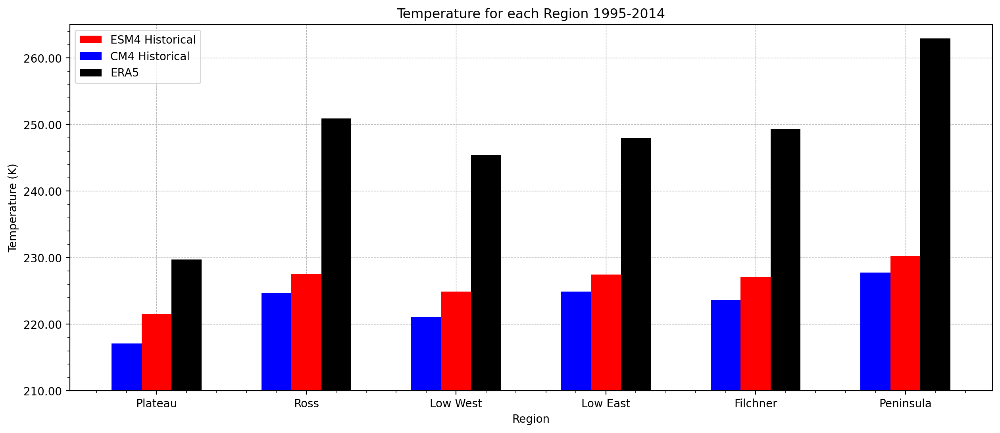

In [104]:

fig, ax= plt.subplots(figsize= (15,6))


X = ['Plateau','Ross','Low West','Low East', 'Filchner', 'Peninsula'] 
CM4_total = [217.09183,
224.71094,
221.12605,
224.93533,
223.62605,
227.78317] 
ESM4_total = [221.49559,
227.59427,
224.9256,
227.4943,
227.13896,
230.24977
] 
ERA5_total=[
229.69913,
250.91542,
245.39009,
247.97842,
249.37422,
262.96146
 
]
X_axis = np.arange(len(X)) 
ax.grid(linewidth=0.5, linestyle= '--')
ax.set_axisbelow(True)
plt.bar(X_axis, ESM4_total, 0.2, label = 'ESM4 Historical', color='r') 
plt.bar(X_axis - 0.2, CM4_total, 0.2, label = 'CM4 Historical', color= 'blue') 
plt.bar(X_axis + 0.2, ERA5_total, 0.2, label= 'ERA5', color= 'k')
  
plt.xticks(X_axis, X) 
plt.xlabel("Region") 
plt.ylabel("Temperature (K)") 
plt.title("Temperature for each Region 1995-2014") 
plt.legend() 
plt.ylim(210,265)
ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax.minorticks_on()
plt.show() 








Text(0.5, 0.98, 'Temperature (Kelvin) 1995-2014')

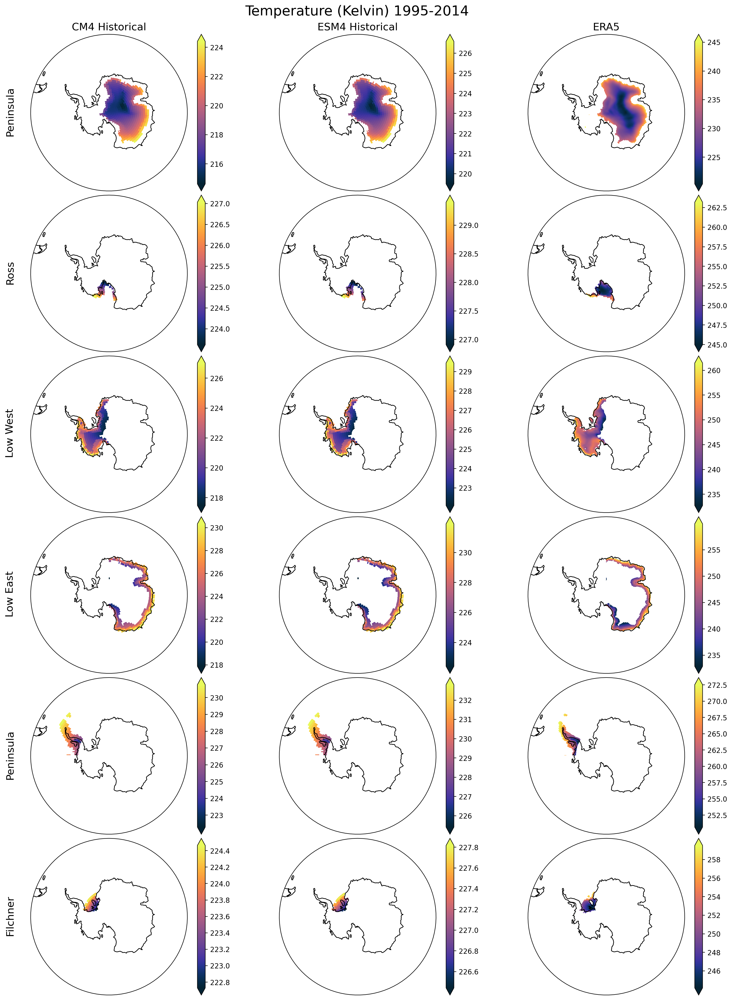

In [31]:
fig, ax = south_pole_map(cols=3, rows=6,fig_size=(15,20))



#CM4 Plots
plateau_temp_total_CM4_spatial_95.plot(ax=ax[0,0],
              transform =ccrs.PlateCarree(),
        
              extend='both',
              cmap=cmocean.cm.thermal)
              
    
ross_temp_total_CM4_spatial_95.plot(ax=ax[1,0],
              transform =ccrs.PlateCarree(),
             
              extend='both',
              cmap=cmocean.cm.thermal)
lowwest_temp_total_CM4_spatial_95.plot(ax=ax[2,0],
               transform =ccrs.PlateCarree(),
               
               extend='both',
               cmap=cmocean.cm.thermal)
    
loweast_temp_total_CM4_spatial_95.plot(ax=ax[3,0],
            transform =ccrs.PlateCarree(),
              
               extend='both',
               cmap= cmocean.cm.thermal)
peninsula_temp_total_CM4_spatial_95.plot(ax=ax[4,0],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.thermal)
filchner_temp_total_CM4_spatial_95.plot(ax=ax[5,0],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.thermal)
#ESM4 Plots

plateau_temp_total_ESM4_spatial_95.plot(ax=ax[0,1],
              transform =ccrs.PlateCarree(),
        
              extend='both',
              cmap=cmocean.cm.thermal)
    
ross_temp_total_ESM4_spatial_95.plot(ax=ax[1,1],
              transform =ccrs.PlateCarree(),
             
              extend='both',
              cmap=cmocean.cm.thermal)
lowwest_temp_total_ESM4_spatial_95.plot(ax=ax[2,1],
               transform =ccrs.PlateCarree(),
               
               extend='both',
               cmap=cmocean.cm.thermal)
    
loweast_temp_total_ESM4_spatial_95.plot(ax=ax[3,1],
            transform =ccrs.PlateCarree(),
              
               extend='both',
               cmap= cmocean.cm.thermal)
peninsula_temp_total_ESM4_spatial_95.plot(ax=ax[4,1],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.thermal)
filchner_temp_total_ESM4_spatial_95.plot(ax=ax[5,1],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.thermal)

#ERA5 Plots
plateau_temp_total_ERA5_spatial_95.plot(ax=ax[0,2],
              transform =ccrs.PlateCarree(),
        
              extend='both',
              cmap=cmocean.cm.thermal)
    
ross_temp_total_ERA5_spatial_95.plot(ax=ax[1,2],
              transform =ccrs.PlateCarree(),
             
              extend='both',
              cmap=cmocean.cm.thermal)
lowwest_temp_total_ERA5_spatial_95.plot(ax=ax[2,2],
               transform =ccrs.PlateCarree(),
               
               extend='both',
               cmap=cmocean.cm.thermal)
    
loweast_temp_total_ERA5_spatial_95.plot(ax=ax[3,2],
            transform =ccrs.PlateCarree(),
              
               extend='both',
               cmap= cmocean.cm.thermal)
peninsula_temp_total_ERA5_spatial_95.plot(ax=ax[4,2],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.thermal)
filchner_temp_total_ERA5_spatial_95.plot(ax=ax[5,2],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.thermal)
ax[0,0].coastlines()
ax[1,0].coastlines()
ax[2,0].coastlines()
ax[3,0].coastlines()
ax[4,0].coastlines()
ax[5,0].coastlines()

ax[0,1].coastlines()
ax[1,1].coastlines()
ax[2,1].coastlines()
ax[3,1].coastlines()
ax[4,1].coastlines()
ax[5,1].coastlines()

ax[0,2].coastlines()
ax[1,2].coastlines()
ax[2,2].coastlines()
ax[3,2].coastlines()
ax[4,2].coastlines()
ax[5,2].coastlines()

ax[0,0].set_title('CM4 Historical',size=15)
ax[0,1].set_title('ESM4 Historical',size=15)
ax[0,2].set_title('ERA5',size=15)

ax[1,2].set_title('')
ax[2,2].set_title('')
ax[3,2].set_title('')
ax[4,2].set_title('')
ax[5,2].set_title('')

rows = ['Peninsula', 'Ross', 'Low West', 'Low East', 'Peninsula', 'Filchner']

for ax, row in zip(ax[:,0], rows):
    ax.annotate(row, xy=(-30, 115), 
                xycoords='axes points', ha='center', va='center', color='k', rotation=90, fontsize=15)

fig.suptitle('Temperature (Kelvin) 1995-2014', fontsize=20)

In [107]:
plat_value_CM4_summer_95=print(plateau_temp_summer_CM4_95.values)
ross_value_CM4_summer_95= print(ross_temp_summer_CM4_95.values)
west_value_CM4_summer_95=print(lowwest_temp_summer_CM4_95.values)
east_value_CM4_summer_95=print(loweast_temp_summer_CM4_95.values)
filch_value_CM4_summer_95=print(filchner_temp_summer_CM4_95.values)
pen_value_CM4_summer_95=print(peninsula_temp_summer_CM4_95.values)

234.19252
239.85101
236.8064
237.26918
239.65926
239.31584


In [109]:
 plat_value_ESM4_summer_95=print(plateau_temp_summer_ESM4_95.values)
ross_value_ESM4_summer_95= print(ross_temp_summer_ESM4_95.values)
west_value_ESM4_summer_95=print(lowwest_temp_summer_ESM4_95.values)
east_value_ESM4_summer_95=print(loweast_temp_summer_ESM4_95.values)
filch_value_ESM4_summer_95=print(filchner_temp_summer_ESM4_95.values)
pen_value_ESM4_summer_95=print(peninsula_temp_summer_ESM4_95.values)

237.02863
241.86879
239.35788
239.44244
241.27629
241.53532


In [110]:
plat_value_ERA5_summer_95=print(plateau_temp_summer_ERA5_95.values)
ross_value_ERA5_summer_95= print(ross_temp_summer_ERA5_95.values)
west_value_ERA5_summer_95=print(lowwest_temp_summer_ERA5_95.values)
east_value_ERA5_summer_95=print(loweast_temp_summer_ERA5_95.values)
filch_value_ERA5_summer_95=print(filchner_temp_summer_ERA5_95.values)
pen_value_ERA5_summer_95=print(peninsula_temp_summer_ERA5_95.values)

242.87717
264.02753
255.77127
257.27936
261.95575
269.5202


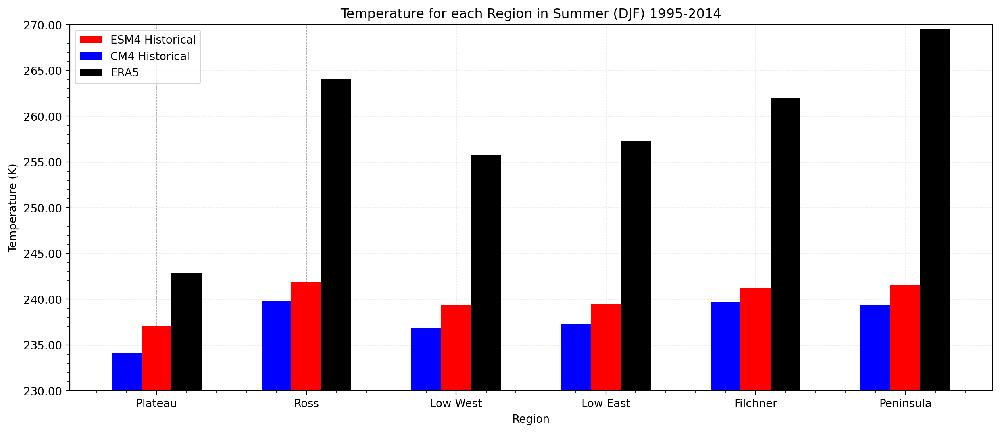

In [114]:

fig, ax= plt.subplots(figsize= (15,6))


X = ['Plateau','Ross','Low West','Low East', 'Filchner', 'Peninsula'] 
CM4_summer = [234.19252,
239.85101,
236.8064,
237.26918,
239.65926,
239.31584
] 
ESM4_summer = [237.02863,
241.86879,
239.35788,
239.44244,
241.27629,
241.53532] 

ERA5_summer=[242.87717,
264.02753,
255.77127,
257.27936,
261.95575,
269.5202
]
X_axis = np.arange(len(X)) 
  
plt.bar(X_axis, ESM4_summer, 0.2, label = 'ESM4 Historical', color='r') 
plt.bar(X_axis - 0.2, CM4_summer, 0.2, label = 'CM4 Historical', color= 'blue') 
plt.bar(X_axis + 0.2, ERA5_summer, 0.2, label= 'ERA5', color= 'k')
ax.grid(linewidth=0.5, linestyle= '--')
ax.set_axisbelow(True)
plt.xticks(X_axis, X) 
plt.xlabel("Region") 
plt.ylabel("Temperature (K)") 
plt.title("Temperature for each Region in Summer (DJF) 1995-2014") 
plt.legend() 
plt.ylim(230,270)
ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax.minorticks_on()
plt.show() 








Text(0.5, 0.98, 'Temperature (Kelvin), Summer (DJF) 1995-2014')

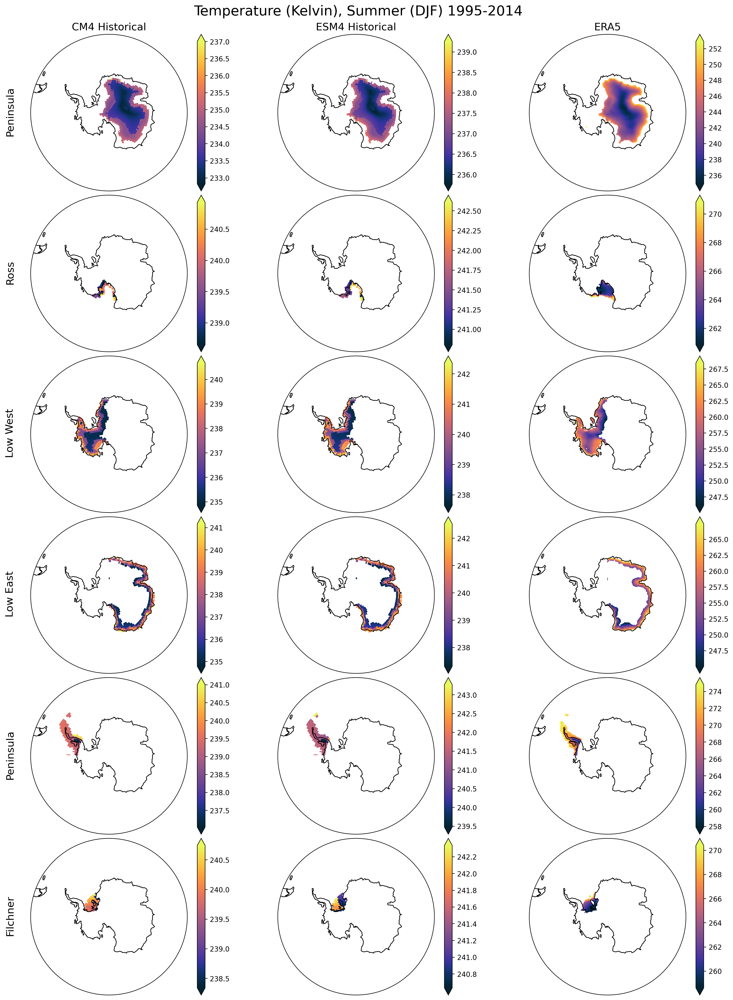

In [32]:
fig, ax = south_pole_map(cols=3, rows=6,fig_size=(15,20))



#CM4 Plots
plateau_temp_summer_CM4_spatial_95.plot(ax=ax[0,0],
              transform =ccrs.PlateCarree(),
        
              extend='both',
              cmap=cmocean.cm.thermal)
    
ross_temp_summer_CM4_spatial_95.plot(ax=ax[1,0],
              transform =ccrs.PlateCarree(),
             
              extend='both',
              cmap=cmocean.cm.thermal)
lowwest_temp_summer_CM4_spatial_95.plot(ax=ax[2,0],
               transform =ccrs.PlateCarree(),
               
               extend='both',
               cmap=cmocean.cm.thermal)
    
loweast_temp_summer_CM4_spatial_95.plot(ax=ax[3,0],
            transform =ccrs.PlateCarree(),
              
               extend='both',
               cmap= cmocean.cm.thermal)
peninsula_temp_summer_CM4_spatial_95.plot(ax=ax[4,0],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.thermal)
filchner_temp_summer_CM4_spatial_95.plot(ax=ax[5,0],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.thermal)
#ESM4 Plots

plateau_temp_summer_ESM4_spatial_95.plot(ax=ax[0,1],
              transform =ccrs.PlateCarree(),
        
              extend='both',
              cmap=cmocean.cm.thermal)
    
ross_temp_summer_ESM4_spatial_95.plot(ax=ax[1,1],
              transform =ccrs.PlateCarree(),
             
              extend='both',
              cmap=cmocean.cm.thermal)
lowwest_temp_summer_ESM4_spatial_95.plot(ax=ax[2,1],
               transform =ccrs.PlateCarree(),
               
               extend='both',
               cmap=cmocean.cm.thermal)
    
loweast_temp_summer_ESM4_spatial_95.plot(ax=ax[3,1],
            transform =ccrs.PlateCarree(),
              
               extend='both',
               cmap= cmocean.cm.thermal)
peninsula_temp_summer_ESM4_spatial_95.plot(ax=ax[4,1],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.thermal)
filchner_temp_summer_ESM4_spatial_95.plot(ax=ax[5,1],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.thermal)

#ERA5 Plots
plateau_temp_summer_ERA5_spatial_95.plot(ax=ax[0,2],
              transform =ccrs.PlateCarree(),
        
              extend='both',
              cmap=cmocean.cm.thermal)
    
ross_temp_summer_ERA5_spatial_95.plot(ax=ax[1,2],
              transform =ccrs.PlateCarree(),
             
              extend='both',
              cmap=cmocean.cm.thermal)
lowwest_temp_summer_ERA5_spatial_95.plot(ax=ax[2,2],
               transform =ccrs.PlateCarree(),
               
               extend='both',
               cmap=cmocean.cm.thermal)
    
loweast_temp_summer_ERA5_spatial_95.plot(ax=ax[3,2],
            transform =ccrs.PlateCarree(),
              
               extend='both',
               cmap= cmocean.cm.thermal)
peninsula_temp_summer_ERA5_spatial_95.plot(ax=ax[4,2],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.thermal)
filchner_temp_summer_ERA5_spatial_95.plot(ax=ax[5,2],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.thermal)
ax[0,0].coastlines()
ax[1,0].coastlines()
ax[2,0].coastlines()
ax[3,0].coastlines()
ax[4,0].coastlines()
ax[5,0].coastlines()

ax[0,1].coastlines()
ax[1,1].coastlines()
ax[2,1].coastlines()
ax[3,1].coastlines()
ax[4,1].coastlines()
ax[5,1].coastlines()

ax[0,2].coastlines()
ax[1,2].coastlines()
ax[2,2].coastlines()
ax[3,2].coastlines()
ax[4,2].coastlines()
ax[5,2].coastlines()

ax[0,0].set_title('CM4 Historical',size=15)
ax[0,1].set_title('ESM4 Historical',size=15)
ax[0,2].set_title('ERA5',size=15)

ax[1,0].set_title('')
ax[2,0].set_title('')
ax[3,0].set_title('')
ax[4,0].set_title('')
ax[5,0].set_title('')

ax[1,1].set_title('')
ax[2,1].set_title('')
ax[3,1].set_title('')
ax[4,1].set_title('')
ax[5,1].set_title('')

ax[1,2].set_title('')
ax[2,2].set_title('')
ax[3,2].set_title('')
ax[4,2].set_title('')
ax[5,2].set_title('')

rows = ['Peninsula', 'Ross', 'Low West', 'Low East', 'Peninsula', 'Filchner']

for ax, row in zip(ax[:,0], rows):
    ax.annotate(row, xy=(-30, 115), 
                xycoords='axes points', ha='center', va='center', color='k', rotation=90, fontsize=15)

fig.suptitle('Temperature (Kelvin), Summer (DJF) 1995-2014', fontsize=20)

In [118]:
plat_value_CM4_winter_95=print(plateau_temp_winter_CM4_95.values)
ross_value_CM4_winter_95= print(ross_temp_winter_CM4_95.values)
west_value_CM4_winter_95=print(lowwest_temp_winter_CM4_95.values)
east_value_CM4_winter_95=print(loweast_temp_winter_CM4_95.values)
filch_value_CM4_winter_95=print(filchner_temp_winter_CM4_95.values)
pen_value_CM4_winter_95=print(peninsula_temp_winter_CM4_95.values)

201.55705
212.0812
207.01996
213.04802
211.67157
218.48322


In [119]:
plat_value_ESM4_winter_95=print(plateau_temp_winter_ESM4_95.values)
ross_value_ESM4_winter_95= print(ross_temp_winter_ESM4_95.values)
west_value_ESM4_winter_95=print(lowwest_temp_winter_ESM4_95.values)
east_value_ESM4_winter_95=print(loweast_temp_winter_ESM4_95.values)
filch_value_ESM4_winter_95=print(filchner_temp_winter_ESM4_95.values)
pen_value_ESM4_winter_95=print(peninsula_temp_winter_ESM4_95.values)

207.52094
215.06512
212.03528
216.12335
215.8927
221.31201


In [120]:
plat_value_ERA5_winter_95=print(plateau_temp_winter_ERA5_95.values)
ross_value_ERA5_winter_95= print(ross_temp_winter_ERA5_95.values)
west_value_ERA5_winter_95=print(lowwest_temp_winter_ERA5_95.values)
east_value_ERA5_winter_95=print(loweast_temp_winter_ERA5_95.values)
filch_value_ERA5_winter_95=print(filchner_temp_winter_ERA5_95.values)
pen_value_ERA5_winter_95=print(peninsula_temp_winter_ERA5_95.values)

221.74731
242.13596
238.46445
242.05879
240.78426
256.95865


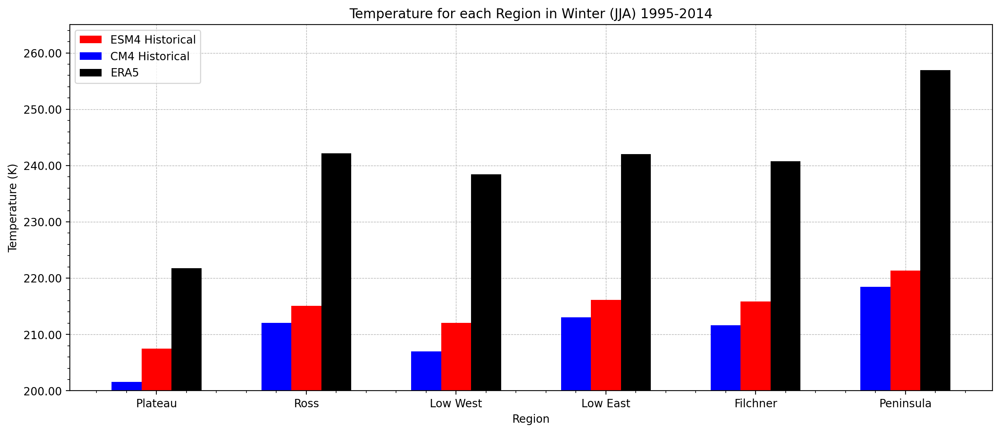

In [123]:

fig, ax= plt.subplots(figsize= (15,6))


X = ['Plateau','Ross','Low West','Low East', 'Filchner', 'Peninsula'] 
CM4_winter = [201.55705,
212.0812,
207.01996,
213.04802,
211.67157,
218.48322
] 
ESM4_winter = [207.52094,
215.06512,
212.03528,
216.12335,
215.8927,
221.31201
] 

ERA5_winter=[221.74731,
242.13596,
238.46445,
242.05879,
240.78426,
256.95865]

X_axis = np.arange(len(X)) 
  
plt.bar(X_axis, ESM4_winter, 0.2, label = 'ESM4 Historical', color='r') 
plt.bar(X_axis - 0.2, CM4_winter, 0.2, label = 'CM4 Historical', color= 'blue') 
plt.bar(X_axis + 0.2, ERA5_winter, 0.2, label= 'ERA5', color= 'k')
ax.grid(linewidth=0.5, linestyle= '--')
ax.set_axisbelow(True)
plt.xticks(X_axis, X) 
plt.xlabel("Region") 
plt.ylabel("Temperature (K)") 
plt.title("Temperature for each Region in Winter (JJA) 1995-2014") 
plt.legend() 
plt.ylim(200,265)
ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax.minorticks_on()
plt.show() 








Text(0.5, 0.98, 'Temperature (Kelvin), Winter (JJA) 1995-2014')

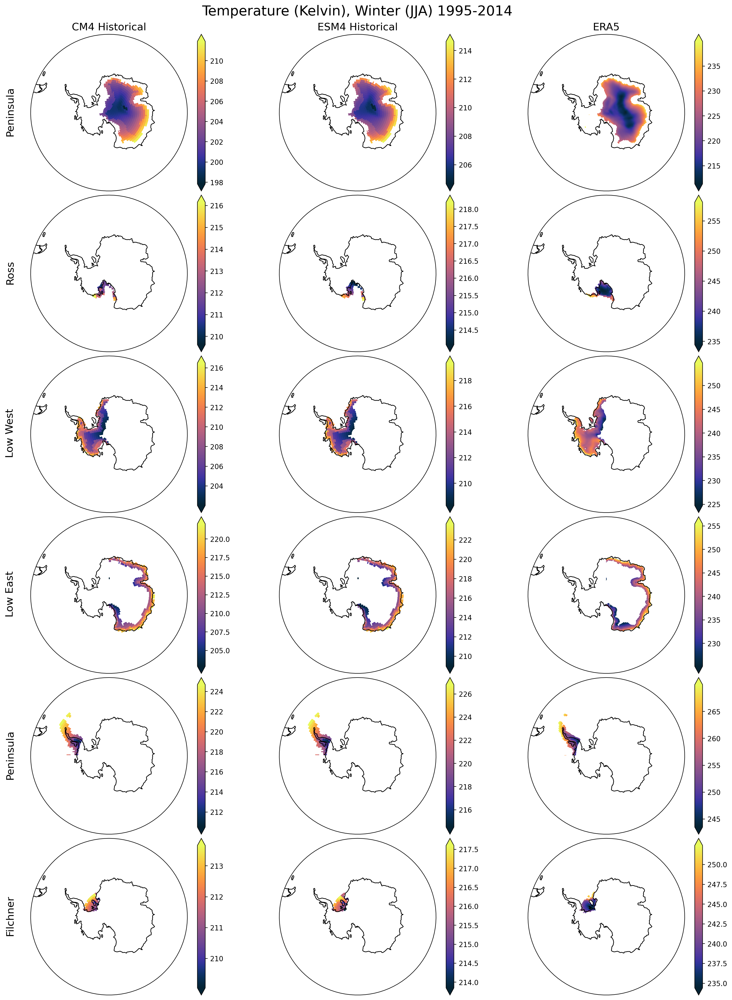

In [33]:
fig, ax = south_pole_map(cols=3, rows=6,fig_size=(15,20))



#CM4 Plots
plateau_temp_winter_CM4_spatial_95.plot(ax=ax[0,0],
              transform =ccrs.PlateCarree(),
        
              extend='both',
              cmap=cmocean.cm.thermal)
    
ross_temp_winter_CM4_spatial_95.plot(ax=ax[1,0],
              transform =ccrs.PlateCarree(),
             
              extend='both',
              cmap=cmocean.cm.thermal)
lowwest_temp_winter_CM4_spatial_95.plot(ax=ax[2,0],
               transform =ccrs.PlateCarree(),
               
               extend='both',
               cmap=cmocean.cm.thermal)
    
loweast_temp_winter_CM4_spatial_95.plot(ax=ax[3,0],
            transform =ccrs.PlateCarree(),
              
               extend='both',
               cmap= cmocean.cm.thermal)
peninsula_temp_winter_CM4_spatial_95.plot(ax=ax[4,0],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.thermal)
filchner_temp_winter_CM4_spatial_95.plot(ax=ax[5,0],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.thermal)
#ESM4 Plots

plateau_temp_winter_ESM4_spatial_95.plot(ax=ax[0,1],
              transform =ccrs.PlateCarree(),
        
              extend='both',
              cmap=cmocean.cm.thermal)
    
ross_temp_winter_ESM4_spatial_95.plot(ax=ax[1,1],
              transform =ccrs.PlateCarree(),
             
              extend='both',
              cmap=cmocean.cm.thermal)
lowwest_temp_winter_ESM4_spatial_95.plot(ax=ax[2,1],
               transform =ccrs.PlateCarree(),
               
               extend='both',
               cmap=cmocean.cm.thermal)
    
loweast_temp_winter_ESM4_spatial_95.plot(ax=ax[3,1],
            transform =ccrs.PlateCarree(),
              
               extend='both',
               cmap= cmocean.cm.thermal)
peninsula_temp_winter_ESM4_spatial_95.plot(ax=ax[4,1],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.thermal)
filchner_temp_winter_ESM4_spatial_95.plot(ax=ax[5,1],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.thermal)

#ERA5 Plots
plateau_temp_winter_ERA5_spatial_95.plot(ax=ax[0,2],
              transform =ccrs.PlateCarree(),
        
              extend='both',
              cmap=cmocean.cm.thermal)
    
ross_temp_winter_ERA5_spatial_95.plot(ax=ax[1,2],
              transform =ccrs.PlateCarree(),
             
              extend='both',
              cmap=cmocean.cm.thermal)
lowwest_temp_winter_ERA5_spatial_95.plot(ax=ax[2,2],
               transform =ccrs.PlateCarree(),
               
               extend='both',
               cmap=cmocean.cm.thermal)
    
loweast_temp_winter_ERA5_spatial_95.plot(ax=ax[3,2],
            transform =ccrs.PlateCarree(),
              
               extend='both',
               cmap= cmocean.cm.thermal)
peninsula_temp_winter_ERA5_spatial_95.plot(ax=ax[4,2],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.thermal)
filchner_temp_winter_ERA5_spatial_95.plot(ax=ax[5,2],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.thermal)
ax[0,0].coastlines()
ax[1,0].coastlines()
ax[2,0].coastlines()
ax[3,0].coastlines()
ax[4,0].coastlines()
ax[5,0].coastlines()

ax[0,1].coastlines()
ax[1,1].coastlines()
ax[2,1].coastlines()
ax[3,1].coastlines()
ax[4,1].coastlines()
ax[5,1].coastlines()

ax[0,2].coastlines()
ax[1,2].coastlines()
ax[2,2].coastlines()
ax[3,2].coastlines()
ax[4,2].coastlines()
ax[5,2].coastlines()

ax[0,0].set_title('CM4 Historical',size=15)
ax[0,1].set_title('ESM4 Historical',size=15)
ax[0,2].set_title('ERA5',size=15)

ax[1,0].set_title('')
ax[2,0].set_title('')
ax[3,0].set_title('')
ax[4,0].set_title('')
ax[5,0].set_title('')

ax[1,1].set_title('')
ax[2,1].set_title('')
ax[3,1].set_title('')
ax[4,1].set_title('')
ax[5,1].set_title('')

ax[1,2].set_title('')
ax[2,2].set_title('')
ax[3,2].set_title('')
ax[4,2].set_title('')
ax[5,2].set_title('')

rows = ['Peninsula', 'Ross', 'Low West', 'Low East', 'Peninsula', 'Filchner']

for ax, row in zip(ax[:,0], rows):
    ax.annotate(row, xy=(-30, 115), 
                xycoords='axes points', ha='center', va='center', color='k', rotation=90, fontsize=15)

fig.suptitle('Temperature (Kelvin), Winter (JJA) 1995-2014', fontsize=20)

In [125]:
plat_value_CM4_fall_95=print(plateau_temp_fall_CM4_95.values)
ross_value_CM4_fall_95= print(ross_temp_fall_CM4_95.values)
west_value_CM4_fall_95=print(lowwest_temp_fall_CM4_95.values)
east_value_CM4_fall_95=print(loweast_temp_fall_CM4_95.values)
filch_value_CM4_fall_95=print(filchner_temp_fall_CM4_95.values)
pen_value_CM4_fall_95=print(peninsula_temp_fall_CM4_95.values)

218.19392
226.40997
222.36238
225.49774
225.63344
230.00516


In [126]:
plat_value_ESM4_fall_95_95=print(plateau_temp_fall_ESM4_95.values)
ross_value_ESM4_fall_95= print(ross_temp_fall_ESM4_95.values)
west_value_ESM4_fall_95=print(lowwest_temp_fall_ESM4_95.values)
east_value_ESM4_fall_95=print(loweast_temp_fall_ESM4_95.values)
filch_value_ESM4_fall_95=print(filchner_temp_fall_ESM4_95.values)
pen_value_ESM4_fall_95=print(peninsula_temp_fall_ESM4_95.values)

220.67163
227.18954
224.4701
226.88853
226.9829
230.5507


In [127]:
plat_value_ERA5_fall_95=print(plateau_temp_fall_ERA5_95.values)
ross_value_ERA5_fall_95= print(ross_temp_fall_ERA5_95.values)
west_value_ERA5_fall_95=print(lowwest_temp_fall_ERA5_95.values)
east_value_ERA5_fall_95=print(loweast_temp_fall_ERA5_95.values)
filch_value_ERA5_fall_95=print(filchner_temp_fall_ERA5_95.values)
pen_value_ERA5_fall_95=print(peninsula_temp_fall_ERA5_95.values)

224.74527
246.42987
242.20746
245.23814
245.04628
262.81323


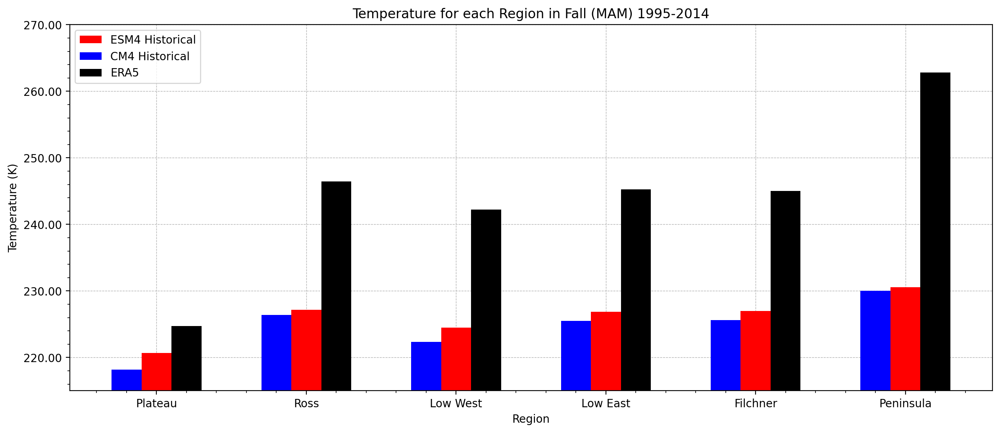

In [129]:

fig, ax= plt.subplots(figsize= (15,6))


X = ['Plateau','Ross','Low West','Low East', 'Filchner', 'Peninsula'] 
CM4_fall = [218.19392,
226.40997,
222.36238,
225.49774,
225.63344,
230.00516
]
ESM4_fall = [220.67163,
227.18954,
224.4701,
226.88853,
226.9829,
230.5507
] 

ERA5_fall = [224.74527,
246.42987,
242.20746,
245.23814,
245.04628,
262.81323
]

X_axis = np.arange(len(X)) 
  
plt.bar(X_axis, ESM4_fall, 0.2, label = 'ESM4 Historical', color='r') 
plt.bar(X_axis - 0.2, CM4_fall, 0.2, label = 'CM4 Historical', color= 'blue') 
plt.bar(X_axis + 0.2, ERA5_fall, 0.2, label= 'ERA5', color= 'k')
ax.grid(linewidth=0.5, linestyle= '--')
ax.set_axisbelow(True)
plt.xticks(X_axis, X) 
plt.xlabel("Region") 
plt.ylabel("Temperature (K)") 
plt.title("Temperature for each Region in Fall (MAM) 1995-2014") 
plt.legend() 
plt.ylim(215,270)
ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax.minorticks_on()
plt.show() 








Text(0.5, 0.98, 'Temperature (Kelvin), Fall (MAM) 1995-2014')

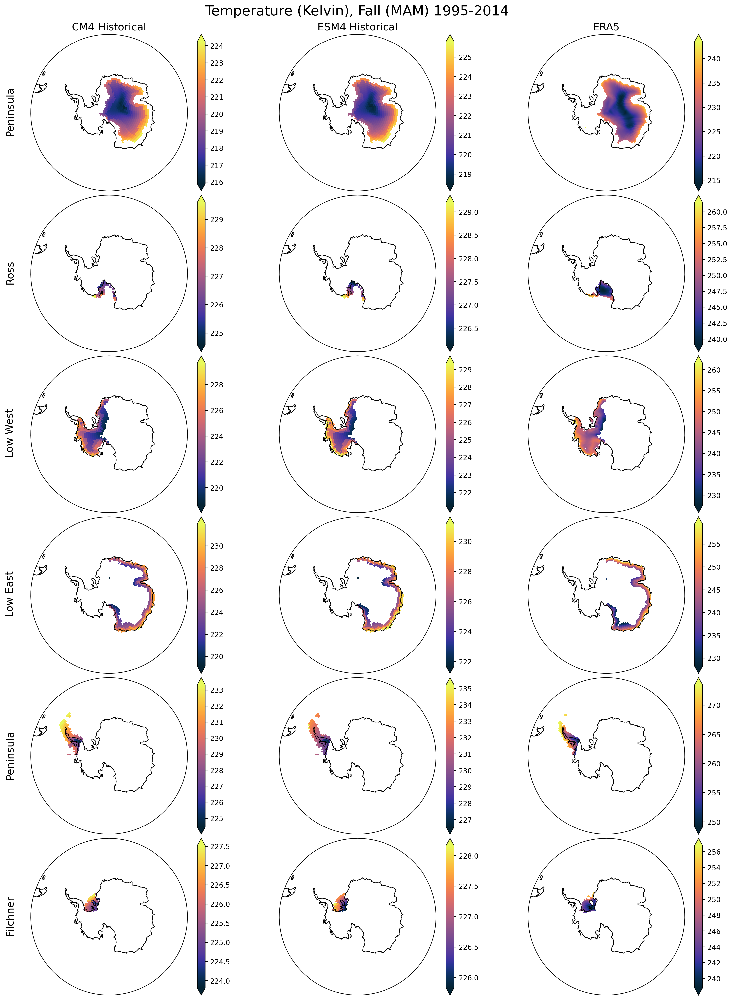

In [34]:
fig, ax = south_pole_map(cols=3, rows=6,fig_size=(15,20))



#CM4 Plots
plateau_temp_fall_CM4_spatial_95.plot(ax=ax[0,0],
              transform =ccrs.PlateCarree(),
        
              extend='both',
              cmap=cmocean.cm.thermal)
    
ross_temp_fall_CM4_spatial_95.plot(ax=ax[1,0],
              transform =ccrs.PlateCarree(),
             
              extend='both',
              cmap=cmocean.cm.thermal)
lowwest_temp_fall_CM4_spatial_95.plot(ax=ax[2,0],
               transform =ccrs.PlateCarree(),
               
               extend='both',
               cmap=cmocean.cm.thermal)
    
loweast_temp_fall_CM4_spatial_95.plot(ax=ax[3,0],
            transform =ccrs.PlateCarree(),
              
               extend='both',
               cmap= cmocean.cm.thermal)
peninsula_temp_fall_CM4_spatial_95.plot(ax=ax[4,0],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.thermal)
filchner_temp_fall_CM4_spatial_95.plot(ax=ax[5,0],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.thermal)
#ESM4 Plots

plateau_temp_fall_ESM4_spatial_95.plot(ax=ax[0,1],
              transform =ccrs.PlateCarree(),
        
              extend='both',
              cmap=cmocean.cm.thermal)
    
ross_temp_fall_ESM4_spatial_95.plot(ax=ax[1,1],
              transform =ccrs.PlateCarree(),
             
              extend='both',
              cmap=cmocean.cm.thermal)
lowwest_temp_fall_ESM4_spatial_95.plot(ax=ax[2,1],
               transform =ccrs.PlateCarree(),
               
               extend='both',
               cmap=cmocean.cm.thermal)
    
loweast_temp_fall_ESM4_spatial_95.plot(ax=ax[3,1],
            transform =ccrs.PlateCarree(),
              
               extend='both',
               cmap= cmocean.cm.thermal)
peninsula_temp_fall_ESM4_spatial_95.plot(ax=ax[4,1],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.thermal)
filchner_temp_fall_ESM4_spatial_95.plot(ax=ax[5,1],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.thermal)

#ERA5 Plots
plateau_temp_fall_ERA5_spatial_95.plot(ax=ax[0,2],
              transform =ccrs.PlateCarree(),
        
              extend='both',
              cmap=cmocean.cm.thermal)
    
ross_temp_fall_ERA5_spatial_95.plot(ax=ax[1,2],
              transform =ccrs.PlateCarree(),
             
              extend='both',
              cmap=cmocean.cm.thermal)
lowwest_temp_fall_ERA5_spatial_95.plot(ax=ax[2,2],
               transform =ccrs.PlateCarree(),
               
               extend='both',
               cmap=cmocean.cm.thermal)
    
loweast_temp_fall_ERA5_spatial_95.plot(ax=ax[3,2],
            transform =ccrs.PlateCarree(),
              
               extend='both',
               cmap= cmocean.cm.thermal)
peninsula_temp_fall_ERA5_spatial_95.plot(ax=ax[4,2],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.thermal)
filchner_temp_fall_ERA5_spatial_95.plot(ax=ax[5,2],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.thermal)
ax[0,0].coastlines()
ax[1,0].coastlines()
ax[2,0].coastlines()
ax[3,0].coastlines()
ax[4,0].coastlines()
ax[5,0].coastlines()

ax[0,1].coastlines()
ax[1,1].coastlines()
ax[2,1].coastlines()
ax[3,1].coastlines()
ax[4,1].coastlines()
ax[5,1].coastlines()

ax[0,2].coastlines()
ax[1,2].coastlines()
ax[2,2].coastlines()
ax[3,2].coastlines()
ax[4,2].coastlines()
ax[5,2].coastlines()

ax[0,0].set_title('CM4 Historical',size=15)
ax[0,1].set_title('ESM4 Historical',size=15)
ax[0,2].set_title('ERA5',size=15)

ax[1,0].set_title('')
ax[2,0].set_title('')
ax[3,0].set_title('')
ax[4,0].set_title('')
ax[5,0].set_title('')

ax[1,1].set_title('')
ax[2,1].set_title('')
ax[3,1].set_title('')
ax[4,1].set_title('')
ax[5,1].set_title('')

ax[1,2].set_title('')
ax[2,2].set_title('')
ax[3,2].set_title('')
ax[4,2].set_title('')
ax[5,2].set_title('')

rows = ['Peninsula', 'Ross', 'Low West', 'Low East', 'Peninsula', 'Filchner']

for ax, row in zip(ax[:,0], rows):
    ax.annotate(row, xy=(-30, 115), 
                xycoords='axes points', ha='center', va='center', color='k', rotation=90, fontsize=15)

fig.suptitle('Temperature (Kelvin), Fall (MAM) 1995-2014', fontsize=20)

In [35]:
plat_value_CM4_spring_95=print(plateau_temp_spring_CM4_95.values)
ross_value_CM4_spring_95= print(ross_temp_spring_CM4_95.values)
west_value_CM4_spring_95=print(lowwest_temp_spring_CM4_95.values)
east_value_CM4_spring_95=print(loweast_temp_spring_CM4_95.values)
filch_value_CM4_spring_95=print(filchner_temp_spring_CM4_95.values)
pen_value_CM4_spring_95=print(peninsula_temp_spring_CM4_95.values)

215.47522
224.11148
219.22346
225.15694
221.03706
226.7553


In [36]:
plat_value_ESM4_spring_95=print(plateau_temp_spring_ESM4_95.values)
ross_value_ESM4_spring_95= print(ross_temp_spring_ESM4_95.values)
west_value_ESM4_spring_95=print(lowwest_temp_spring_ESM4_95.values)
east_value_ESM4_spring_95=print(loweast_temp_spring_ESM4_95.values)
filch_value_ESM4_spring_95=print(filchner_temp_spring_ESM4_95.values)
pen_value_ESM4_spring_95=print(peninsula_temp_spring_ESM4_95.values)

221.41223
228.19887
224.43707
228.23933
227.03035
230.49115


In [37]:
plat_value_ERA5_spring_95=print(plateau_temp_spring_ERA5_95.values)
ross_value_ERA5_spring_95= print(ross_temp_spring_ERA5_95.values)
west_value_ERA5_spring_95=print(lowwest_temp_spring_ERA5_95.values)
east_value_ERA5_spring_95=print(loweast_temp_spring_ERA5_95.values)
filch_value_ERA5_spring_95=print(filchner_temp_spring_ERA5_95.values)
pen_value_ERA5_spring_95=print(peninsula_temp_spring_ERA5_95.values)

229.4267
251.0683
245.11714
247.33748
249.71054
262.55365


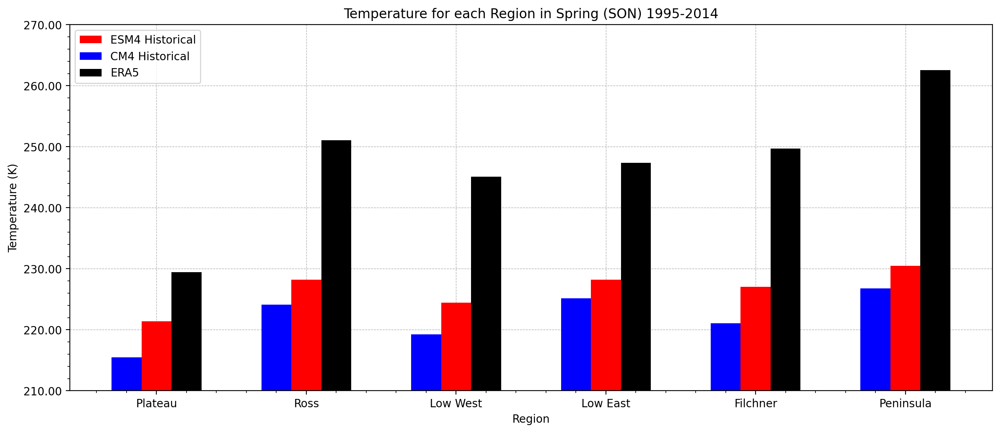

In [40]:

fig, ax= plt.subplots(figsize= (15,6))


X = ['Plateau','Ross','Low West','Low East', 'Filchner', 'Peninsula'] 
CM4_spring = [215.47522,
224.11148,
219.22346,
225.15694,
221.03706,
226.7553
] 
ESM4_spring = [221.41223,
228.19887,
224.43707,
228.23933,
227.03035,
230.49115] 

ERA5_spring=[229.4267,
251.0683,
245.11714,
247.33748,
249.71054,
262.55365
]
  
X_axis = np.arange(len(X)) 
  
plt.bar(X_axis, ESM4_spring, 0.2, label = 'ESM4 Historical', color='r') 
plt.bar(X_axis - 0.2, CM4_spring, 0.2, label = 'CM4 Historical', color= 'blue') 
plt.bar(X_axis + 0.2, ERA5_spring, 0.2, label= 'ERA5', color= 'k')
ax.grid(linewidth=0.5, linestyle= '--')
ax.set_axisbelow(True)
plt.xticks(X_axis, X) 
plt.xlabel("Region") 
plt.ylabel("Temperature (K)") 
plt.title("Temperature for each Region in Spring (SON) 1995-2014") 
plt.legend() 
plt.ylim(210,270)
ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax.minorticks_on()
plt.show() 







Text(0.5, 0.98, 'Temperature (Kelvin), Spring (SON) 1995-2014')

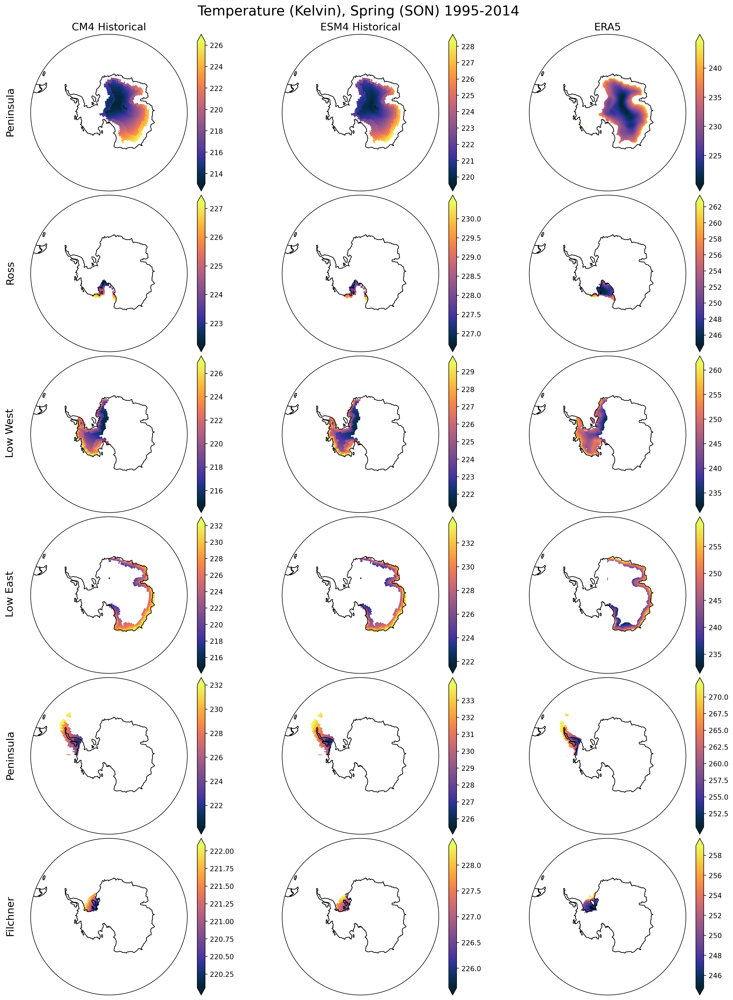

In [41]:
fig, ax = south_pole_map(cols=3, rows=6,fig_size=(15,20))



#CM4 Plots
plateau_temp_spring_CM4_spatial_95.plot(ax=ax[0,0],
              transform =ccrs.PlateCarree(),
        
              extend='both',
              cmap=cmocean.cm.thermal)

ross_temp_spring_CM4_spatial_95.plot(ax=ax[1,0],
              transform =ccrs.PlateCarree(),
             
              extend='both',
              cmap=cmocean.cm.thermal)
lowwest_temp_spring_CM4_spatial_95.plot(ax=ax[2,0],
               transform =ccrs.PlateCarree(),
               
               extend='both',
               cmap=cmocean.cm.thermal)
    
loweast_temp_spring_CM4_spatial_95.plot(ax=ax[3,0],
            transform =ccrs.PlateCarree(),
              
               extend='both',
               cmap= cmocean.cm.thermal)
peninsula_temp_spring_CM4_spatial_95.plot(ax=ax[4,0],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.thermal)
filchner_temp_spring_CM4_spatial_95.plot(ax=ax[5,0],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.thermal)
#ESM4 Plots

plateau_temp_spring_ESM4_spatial_95.plot(ax=ax[0,1],
              transform =ccrs.PlateCarree(),
        
              extend='both',
              cmap=cmocean.cm.thermal)
    
ross_temp_spring_ESM4_spatial_95.plot(ax=ax[1,1],
              transform =ccrs.PlateCarree(),
             
              extend='both',
              cmap=cmocean.cm.thermal)
lowwest_temp_spring_ESM4_spatial_95.plot(ax=ax[2,1],
               transform =ccrs.PlateCarree(),
               
               extend='both',
               cmap=cmocean.cm.thermal)
    
loweast_temp_spring_ESM4_spatial_95.plot(ax=ax[3,1],
            transform =ccrs.PlateCarree(),
              
               extend='both',
               cmap= cmocean.cm.thermal)
peninsula_temp_spring_ESM4_spatial_95.plot(ax=ax[4,1],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.thermal)
filchner_temp_spring_ESM4_spatial_95.plot(ax=ax[5,1],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.thermal)

#ERA5 Plots
plateau_temp_spring_ERA5_spatial_95.plot(ax=ax[0,2],
              transform =ccrs.PlateCarree(),
        
              extend='both',
              cmap=cmocean.cm.thermal)
    
ross_temp_spring_ERA5_spatial_95.plot(ax=ax[1,2],
              transform =ccrs.PlateCarree(),
             
              extend='both',
              cmap=cmocean.cm.thermal)
lowwest_temp_spring_ERA5_spatial_95.plot(ax=ax[2,2],
               transform =ccrs.PlateCarree(),
               
               extend='both',
               cmap=cmocean.cm.thermal)
    
loweast_temp_spring_ERA5_spatial_95.plot(ax=ax[3,2],
            transform =ccrs.PlateCarree(),
              
               extend='both',
               cmap= cmocean.cm.thermal)
peninsula_temp_spring_ERA5_spatial_95.plot(ax=ax[4,2],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.thermal)
filchner_temp_spring_ERA5_spatial_95.plot(ax=ax[5,2],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.thermal)
ax[0,0].coastlines()
ax[1,0].coastlines()
ax[2,0].coastlines()
ax[3,0].coastlines()
ax[4,0].coastlines()
ax[5,0].coastlines()

ax[0,1].coastlines()
ax[1,1].coastlines()
ax[2,1].coastlines()
ax[3,1].coastlines()
ax[4,1].coastlines()
ax[5,1].coastlines()

ax[0,2].coastlines()
ax[1,2].coastlines()
ax[2,2].coastlines()
ax[3,2].coastlines()
ax[4,2].coastlines()
ax[5,2].coastlines()

ax[0,0].set_title('CM4 Historical',size=15)
ax[0,1].set_title('ESM4 Historical',size=15)
ax[0,2].set_title('ERA5',size=15)

ax[1,0].set_title('')
ax[2,0].set_title('')
ax[3,0].set_title('')
ax[4,0].set_title('')
ax[5,0].set_title('')

ax[1,1].set_title('')
ax[2,1].set_title('')
ax[3,1].set_title('')
ax[4,1].set_title('')
ax[5,1].set_title('')

ax[1,2].set_title('')
ax[2,2].set_title('')
ax[3,2].set_title('')
ax[4,2].set_title('')
ax[5,2].set_title('')

rows = ['Peninsula', 'Ross', 'Low West', 'Low East', 'Peninsula', 'Filchner']

for ax, row in zip(ax[:,0], rows):
    ax.annotate(row, xy=(-30, 115), 
                xycoords='axes points', ha='center', va='center', color='k', rotation=90, fontsize=15)

fig.suptitle('Temperature (Kelvin), Spring (SON) 1995-2014', fontsize=20)